In [ ]:
#@title Mount google drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Load Omic data for TCGA LUSC

In [ ]:
!pip install rpy2==3.5.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201.7/201.7 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for rpy2: filename=rpy2-3.5.1-cp310-cp310-linux_x86_64.whl size=314954 sha256=fd0f5cb64bc01172773d9897feb232353bcd6373bdfd4dfd3f7139c6f5336c6f
  Stored in directory: /root/.cache/pip/wheels/73/a6/ff/4e75dd1ce1cfa2b9a670cbccf6a1e41c553199e9b25f05d953
Successfully built rpy2
  Attempting uninstall: rpy2
    Found existing installation: rpy2 3.4.2
    Uninstalling rpy2-3.4.2:
      Successfully uninstalled rpy2-3.4.2


In [ ]:
%load_ext rpy2.ipython

In [ ]:
#Set working directory
%%R
getwd()

[1] "/content"


Load Methylation data


In [ ]:
%%R
Meth = read.delim("/content/gdrive/MyDrive/PHD projects/LUSC Cancer/data/Human__TCGA_LUSC__JHU_USC__Methylation__Meth450__01_28_2016__BI__Gene__Firehose_Methylation_Prepocessor.cct" ,header = TRUE, sep = "\t")

In [ ]:
%%R
knitr:: kable(head(Meth), "pipe", align = c("l", "c", "c") )



|attrib_name | TCGA.18.3417 | TCGA.18.4721 |TCGA.18.5592 | TCGA.18.5595 | TCGA.21.5782 |TCGA.21.5783 | TCGA.21.5784 | TCGA.21.5786 |TCGA.21.5787 | TCGA.21.A5DI | TCGA.22.4593 |TCGA.22.4599 | TCGA.22.4601 | TCGA.22.4605 |TCGA.22.4609 | TCGA.22.4613 | TCGA.22.5471 |TCGA.22.5472 | TCGA.22.5473 | TCGA.22.5474 |TCGA.22.5477 | TCGA.22.5478 | TCGA.22.5479 |TCGA.22.5480 | TCGA.22.5481 | TCGA.22.5482 |TCGA.22.5483 | TCGA.22.5485 | TCGA.22.5489 |TCGA.22.5491 | TCGA.22.5492 | TCGA.22.A5C4 |TCGA.33.4566 | TCGA.33.4582 | TCGA.33.4583 |TCGA.33.4586 | TCGA.33.4587 | TCGA.33.4589 |TCGA.33.6737 | TCGA.33.6738 | TCGA.33.A4WN |TCGA.33.A5GW | TCGA.33.AAS8 | TCGA.33.AASB |TCGA.33.AASD | TCGA.33.AASI | TCGA.33.AASJ |TCGA.33.AASL | TCGA.34.5231 | TCGA.34.5232 |TCGA.34.5234 | TCGA.34.5236 | TCGA.34.5239 |TCGA.34.5240 | TCGA.34.5241 | TCGA.34.5927 |TCGA.34.5928 | TCGA.34.5929 | TCGA.34.7107 |TCGA.34.8454 | TCGA.34.8455 | TCGA.34.8456 |TCGA.34.A5IX | TCGA.37.5819 | TCGA.37.A5EL |TCGA.37.A5EM | TCGA.37.A5EN | 

In [ ]:
%%R
%%Rdim(Meth)

[1] 20116   371


In [ ]:
%%R
RNA= Meth

# Cleaning the data

## Data filtration

In [ ]:
%%R
## make features as a column
RNA_T= t(RNA)

In [ ]:
%%R
knitr:: kable(head(RNA_T), "pipe", align = c("l", "c", "c") )



|             |        |         |         |        |         |         |        |         |         |        |        |         |       |         |        |        |         |         |       |        |         |        |         |         |        |         |        |        |         |         |       |         |        |       |        |        |       |         |          |        |         |        |        |         |        |        |         |         |        |         |        |        |         |         |        |         |         |       |         |        |        |         |         |        |           |        |       |         |         |        |        |         |        |           |        |        |         |         |        |         |         |         |         |        |        |         |         |        |        |         |        |         |        |        |         |         |        |          |         |        |         |         |        |     

In [ ]:
%%R
rowNms = RNA_T[ ,1]
colNms = RNA_T [1,]
RNA_T1 = RNA_T[-1,]


In [ ]:
%%R
colnames(RNA_T1) = colNms

In [ ]:
%%R

knitr:: kable(head(RNA_T1), "pipe", align = c("l", "c", "c") )



|             |RBL2    |  VDAC3  |  ACTN1  |ATP2A1  |  SFRP1  |  NIPA2  |MAN1B1  | TSEN34  | LRRC16A |CNBP    | DDX55  | FAM81A  |NPHP4  | MRPS25  |  MAEL  |PROX1   | ELOVL1  | LILRA6  |NR5A2  | CDK10  | TMEM182 |ETV6    | DNAJA2  |  ATOH7  |LRFN1   | MRPL12  | COL6A3 |C8orf31 |  RTTN   | CD2BP2  |SLMAP  |   NOV   |  MXD4  |MUSTN1 | TAS1R3 | ITGAD  |S100A5 | SMARCC2 | C1orf114 |TMEM49  | C1orf65 | DNAH17 |DAB1    |  SLBP   |  RFX5  |TNNT2   |  LHX5   |  CASZ1  |C3orf16 | WFIKKN2 | MEOX2  |CKLF    | TRANK1  |  ZFP36  |SLC2A9  |  MXRA7  |  LOXL4  |P2RX6P |  SFRS7  | CSMD2  |EHMT1   | AGPAT3  |   AGA   |LDHD    | C14orf181 | SH2B3  |MTMR7  |  MT1F   |  RSPO3  |ANKRD11 | TDRD6  |  WWP2   |OR1F2P  | SERPINB12 |  DOK7  |SRCAP   | FAM180B | MTHFD2L |HOXD3   |  GPHN   |  HMX2   |C12orf44 | TDRD10  |  OTOF  |NHLH1   | NUP210L | CCDC126 |MTUS2   | ZNF362 |  LHX6   |RRS1    |  PTPRF  | PACS2  |ZNF77   | LRRC16B | ZBTB7A  |CACNA1A | C6orf168 | ZNF358  |SLC6A5  |  DSTYK  |  PANX1  |ZNF581  | FAM1

In [ ]:
%%R
head(rownames(RNA_T1))

[1] "TCGA.18.3417" "TCGA.18.4721" "TCGA.18.5592" "TCGA.18.5595" "TCGA.21.5782"
[6] "TCGA.21.5783"


remove features with zero variance`

In [ ]:
%%R
varCol_RNA=apply(RNA_T1, 2, var, na.rm = T)

In [ ]:
%%R
constCol_RNA <- (varCol_RNA == 0 | is.na(varCol_RNA))

In [ ]:
%%R
sum(constCol_RNA)

[1] 0


# Compute missinigness rate in your metaboloites

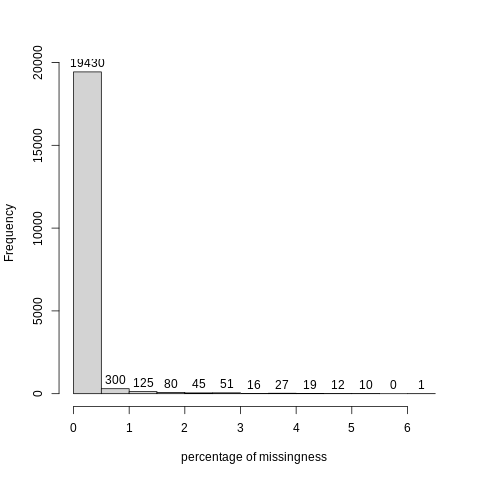

In [ ]:
%%R
h=hist((apply(is.na(RNA_T1), 2, sum)/nrow(RNA_T1) ) *100,breaks=10,
main="",
xlab="percentage of missingness")
text(h$mids,h$counts,labels=h$counts, adj=c(0.5, -0.5))
abline(v = 50)


In [ ]:
%%R
good.inx_RNA=apply(is.na(RNA_T1), 2, sum)/nrow(RNA_T1) <0.5
RNA1=RNA_T1[,good.inx_RNA]
dim(RNA1)

[1]   370 20116


In [ ]:
%%R
write.csv(RNA_T1,"/content/gdrive/MyDrive/PHD projects/LUSC Cancer/Meth_preprocessing1.csv")

# Impute missing values

# python

In [ ]:
import pandas as pd
df = pd.read_csv('/content/gdrive/MyDrive/PHD projects/LUSC Cancer/Meth_preprocessing1.csv')

In [ ]:
df.head(13)

,Unnamed: 0,RBL2,VDAC3,ACTN1,ATP2A1,SFRP1,NIPA2,MAN1B1,TSEN34,LRRC16A,...,BAGE5,BAGE,BAGE2,BAGE4,BAGE3,MIR637,LOC100130932,GOLGA8F,GOLGA8G,MIR7-1
0,TCGA.18.3417,-0.4617,-0.4736,-0.0180,-0.4240,-0.1795,-0.4895,-0.4915,-0.4622,-0.4743,...,0.1322,0.1322,0.1322,0.1322,0.1322,0.3941,0.4371,-0.0775,-0.0775,-0.3743
1,TCGA.18.4721,-0.4649,-0.4838,0.1553,-0.1274,-0.0815,-0.4888,-0.4924,-0.4601,-0.4728,...,0.1220,0.1220,0.1220,0.1220,0.1220,0.3837,0.4665,-0.0027,-0.0027,-0.3693
2,TCGA.18.5592,-0.4315,-0.4369,-0.0846,-0.4031,0.0551,-0.4862,-0.4896,-0.4568,-0.4756,...,0.1621,0.1621,0.1621,0.1621,0.1621,0.3839,0.4259,-0.1072,-0.1072,-0.4288
3,TCGA.18.5595,-0.4549,-0.4608,-0.0414,-0.3157,-0.3855,-0.4854,-0.4859,-0.4551,-0.4666,...,-0.1077,-0.1077,-0.1077,-0.1077,-0.1077,0.3665,0.2255,-0.1289,-0.1289,-0.4045
4,TCGA.21.5782,-0.4476,-0.4710,-0.0140,-0.3265,-0.3793,-0.4892,-0.4920,-0.4323,-0.4712,...,0.0397,0.0397,0.0397,0.0397,0.0397,0.3952,0.4662,-0.1156,-0.1156,-0.3513
5,TCGA.21.5783,-0.4579,-0.4604,-0.1078,-0.3825,-0.4172,-0.4855,-0.4880,-0.4529,-0.4750,...,-0.0483,-0.0483,-0.0483,-0.0483,-0.0483,0.3793,0.4136,-0.0694,-0.0694,-0.3631
6,TCGA.21.5784,-0.4548,-0.4724,0.0881,-0.3475,-0.2595,-0.4903,-0.4893,-0.4601,-0.4685,...,0.1855,0.1855,0.1855,0.1855,0.1855,0.3936,0.4458,-0.0761,-0.0761,-0.4349
7,TCGA.21.5786,-0.4677,-0.4427,0.0075,-0.2506,-0.3692,-0.4905,-0.4894,-0.4652,-0.4761,...,0.0566,0.0566,0.0566,0.0566,0.0566,0.4157,0.4221,-0.0662,-0.0662,-0.3532
8,TCGA.21.5787,-0.4631,-0.4770,0.1521,-0.2120,-0.4006,-0.4906,-0.4914,-0.4738,-0.4786,...,-0.0128,-0.0128,-0.0128,-0.0128,-0.0128,0.3979,0.4558,-0.1691,-0.1691,-0.4334
9,TCGA.21.A5DI,-0.4621,-0.4345,-0.1649,-0.3929,-0.3614,-0.4844,-0.4857,-0.4523,-0.4573,...,0.0032,0.0032,0.0032,0.0032,0.0032,0.3838,0.4146,-0.1065,-0.1065,-0.3831


In [ ]:
import numpy as np
from sklearn.impute import KNNImputer

In [ ]:
nan = np.nan

In [ ]:
imputer = KNNImputer(n_neighbors=6, weights="uniform")

In [ ]:
df.iloc[: , 1:].head()

,RBL2,VDAC3,ACTN1,ATP2A1,SFRP1,NIPA2,MAN1B1,TSEN34,LRRC16A,CNBP,...,BAGE5,BAGE,BAGE2,BAGE4,BAGE3,MIR637,LOC100130932,GOLGA8F,GOLGA8G,MIR7-1
0,-0.4617,-0.4736,-0.0180,-0.4240,-0.1795,-0.4895,-0.4915,-0.4622,-0.4743,0.0689,...,0.1322,0.1322,0.1322,0.1322,0.1322,0.3941,0.4371,-0.0775,-0.0775,-0.3743
1,-0.4649,-0.4838,0.1553,-0.1274,-0.0815,-0.4888,-0.4924,-0.4601,-0.4728,0.1891,...,0.1220,0.1220,0.1220,0.1220,0.1220,0.3837,0.4665,-0.0027,-0.0027,-0.3693
2,-0.4315,-0.4369,-0.0846,-0.4031,0.0551,-0.4862,-0.4896,-0.4568,-0.4756,0.1280,...,0.1621,0.1621,0.1621,0.1621,0.1621,0.3839,0.4259,-0.1072,-0.1072,-0.4288
3,-0.4549,-0.4608,-0.0414,-0.3157,-0.3855,-0.4854,-0.4859,-0.4551,-0.4666,-0.2118,...,-0.1077,-0.1077,-0.1077,-0.1077,-0.1077,0.3665,0.2255,-0.1289,-0.1289,-0.4045
4,-0.4476,-0.4710,-0.0140,-0.3265,-0.3793,-0.4892,-0.4920,-0.4323,-0.4712,0.1121,...,0.0397,0.0397,0.0397,0.0397,0.0397,0.3952,0.4662,-0.1156,-0.1156,-0.3513


In [ ]:
df.iloc[: , 1:] = imputer.fit_transform(df.iloc[: , 1:])

In [ ]:
df.to_csv("/content/gdrive/MyDrive/PHD projects/LUSC Cancer/Meth_preprocessing2.csv")

# Normalization
## Log transformation

# R

read files after imputing

In [ ]:
%%R
RNA = read.csv("/content/gdrive/MyDrive/PHD projects/LUSC Cancer/Meth_preprocessing2.csv")

In [ ]:
%%R
knitr:: kable(head(RNA), "pipe", align = c("l", "c", "c") )



|X  |  Unnamed..0  |  RBL2   |VDAC3   |  ACTN1  | ATP2A1  |SFRP1   |  NIPA2  | MAN1B1  |TSEN34  | LRRC16A |  CNBP   |DDX55  | FAM81A  | NPHP4  |MRPS25  |  MAEL  |  PROX1  |ELOVL1  | LILRA6  | NR5A2  |CDK10  | TMEM182 |  ETV6   |DNAJA2  |  ATOH7  |  LRFN1  |MRPL12  | COL6A3 | C8orf31 |RTTN    | CD2BP2  | SLMAP  |NOV     |  MXD4  | MUSTN1 |TAS1R3 | ITGAD  | S100A5 |SMARCC2 | C1orf114 | TMEM49  |C1orf65 | DNAH17 |  DAB1   |SLBP    |  RFX5  |  TNNT2  |LHX5    |  CASZ1  | C3orf16 |WFIKKN2 | MEOX2  |  CKLF   |TRANK1  |  ZFP36  | SLC2A9  |MXRA7   |  LOXL4  | P2RX6P |SFRS7   | CSMD2  |  EHMT1  |AGPAT3  |   AGA   |  LDHD   |C14orf181 | SH2B3  | MTMR7  |MT1F    |  RSPO3  | ANKRD11 |TDRD6  |  WWP2   | OR1F2P  |SERPINB12 |  DOK7  |  SRCAP  |FAM180B | MTHFD2L |  HOXD3  |GPHN    |  HMX2   | C12orf44 |TDRD10  |  OTOF  |  NHLH1  |NUP210L | CCDC126 |  MTUS2  |ZNF362 |  LHX6   |  RRS1   |PTPRF   | PACS2  |  ZNF77  |LRRC16B | ZBTB7A  | CACNA1A |C6orf168 | ZNF358  | SLC6A5  |DSTYK   |  PANX1  | ZNF581  

In [ ]:
%%R
RNA1= RNA[,-1:-2]

In [ ]:
%%R
RNA.logged <- log2(RNA1 + 1)

show distribution of methylation

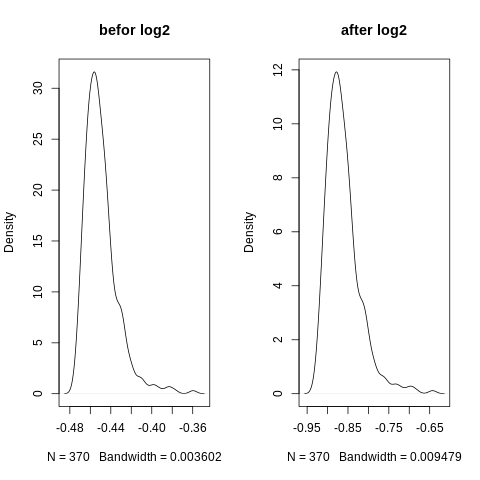

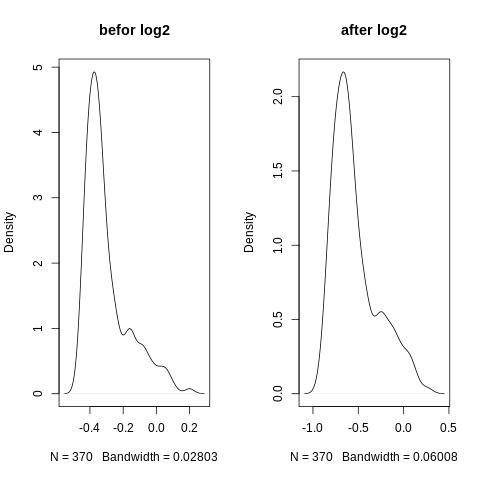

In [ ]:
%%R
options(repr.plot.width=15,repr.plot.height=8)

par(mfrow=c(1,2))
plot(density( RNA1[,1]) ,main='befor log2')
plot(density( RNA.logged[,1]), main='after log2' )


par(mfrow=c(1,2))
plot(density( RNA1[,5]) ,main='befor log2')
plot(density( RNA.logged[,5]), main='after log2' )


In [ ]:
%%R
rownames(RNA.logged) = RNA[,2]
knitr:: kable(head(RNA.logged), "pipe", align = c("l", "c", "c") )




|             |RBL2       |   VDAC3    |   ACTN1    |ATP2A1     |   SFRP1    |   NIPA2    |MAN1B1     |   TSEN34   |  LRRC16A   |CNBP       |   DDX55   |   FAM81A   |NPHP4     |   MRPS25   |   MAEL    |PROX1      |   ELOVL1   |   LILRA6   |NR5A2     |   CDK10   |  TMEM182   |ETV6       |   DNAJA2   |   ATOH7    |LRFN1      |   MRPL12   |  COL6A3   |C8orf31    |    RTTN    |   CD2BP2   |SLMAP     |    NOV     |   MXD4    |MUSTN1    |  TAS1R3   |   ITGAD   |S100A5    |  SMARCC2   |  C1orf114  |TMEM49     |  C1orf65   |  DNAH17   |DAB1       |    SLBP    |   RFX5    |TNNT2      |    LHX5    |   CASZ1    |C3orf16    |  WFIKKN2   |   MEOX2   |CKLF       |   TRANK1   |   ZFP36    |SLC2A9     |   MXRA7    |   LOXL4    |P2RX6P    |   SFRS7    |   CSMD2   |EHMT1      |   AGPAT3   |    AGA     |LDHD       | C14orf181  |   SH2B3   |MTMR7     |    MT1F    |   RSPO3    |ANKRD11   |   TDRD6   |    WWP2    |OR1F2P     | SERPINB12 |   DOK7    |SRCAP      |  FAM180B  |  MTHFD2L   |HOXD3      |    GPH

In [ ]:
%%R
write.csv(RNA.logged,"/content/gdrive/MyDrive/PHD projects/LUSC Cancer/Meth_preprocessing3.csv")

Dist data using barplot

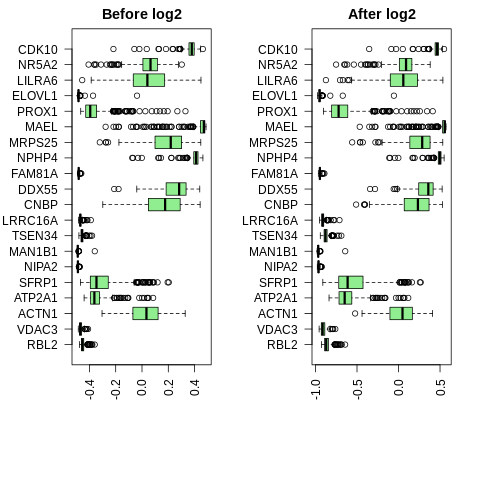

In [ ]:
%%R
options(repr.plot.width=10,repr.plot.height=8)
par(mar = c(8,5,2,2),mfrow=c(1,2))
boxplot(RNA1[,1:20], main="Before log2" ,horizontal=T, names=colnames(RNA1)[1:20],las=2,
       col = "lightgreen")
boxplot(RNA.logged[,1:20], main="After log2" ,horizontal=T, names=colnames(RNA.logged)[1:20],
        las=2,col = "lightgreen")


Scale

In [ ]:
%%R
knitr:: kable(head(RNA.logged), "pipe", align = c("l", "c", "c") )



|             |RBL2       |   VDAC3    |   ACTN1    |ATP2A1     |   SFRP1    |   NIPA2    |MAN1B1     |   TSEN34   |  LRRC16A   |CNBP       |   DDX55   |   FAM81A   |NPHP4     |   MRPS25   |   MAEL    |PROX1      |   ELOVL1   |   LILRA6   |NR5A2     |   CDK10   |  TMEM182   |ETV6       |   DNAJA2   |   ATOH7    |LRFN1      |   MRPL12   |  COL6A3   |C8orf31    |    RTTN    |   CD2BP2   |SLMAP     |    NOV     |   MXD4    |MUSTN1    |  TAS1R3   |   ITGAD   |S100A5    |  SMARCC2   |  C1orf114  |TMEM49     |  C1orf65   |  DNAH17   |DAB1       |    SLBP    |   RFX5    |TNNT2      |    LHX5    |   CASZ1    |C3orf16    |  WFIKKN2   |   MEOX2   |CKLF       |   TRANK1   |   ZFP36    |SLC2A9     |   MXRA7    |   LOXL4    |P2RX6P    |   SFRS7    |   CSMD2   |EHMT1      |   AGPAT3   |    AGA     |LDHD       | C14orf181  |   SH2B3   |MTMR7     |    MT1F    |   RSPO3    |ANKRD11   |   TDRD6   |    WWP2    |OR1F2P     | SERPINB12 |   DOK7    |SRCAP      |  FAM180B  |  MTHFD2L   |HOXD3      |    GPH

In [ ]:
%%R
RNA.logged1 = RNA.logged

In [ ]:
%%R
RNA.logged.scaled=scale(RNA.logged1,center = TRUE, scale = TRUE)

In [ ]:
%%R
rownames(RNA.logged.scaled) = rownames(RNA.logged)

In [ ]:
%%R
knitr:: kable(head(RNA.logged.scaled), "pipe", align = c("l", "c", "c") )



|             |RBL2       |   VDAC3    |   ACTN1    |ATP2A1     |   SFRP1    |   NIPA2    |MAN1B1     |   TSEN34   |  LRRC16A   |CNBP       |   DDX55    |   FAM81A   |NPHP4      |   MRPS25   |   MAEL    |PROX1      |   ELOVL1   |   LILRA6   |NR5A2      |   CDK10    |  TMEM182   |ETV6       |   DNAJA2   |   ATOH7    |LRFN1      |   MRPL12   |   COL6A3   |C8orf31    |    RTTN    |   CD2BP2   |SLMAP      |    NOV     |    MXD4    |MUSTN1     |   TAS1R3   |   ITGAD    |S100A5     |  SMARCC2   |  C1orf114  |TMEM49     |  C1orf65   |  DNAH17   |DAB1       |    SLBP    |    RFX5    |TNNT2      |    LHX5    |   CASZ1    |C3orf16    |  WFIKKN2   |   MEOX2    |CKLF       |   TRANK1   |   ZFP36    |SLC2A9     |   MXRA7    |   LOXL4    |P2RX6P     |   SFRS7    |   CSMD2   |EHMT1      |   AGPAT3   |    AGA     |LDHD       | C14orf181  |   SH2B3    |MTMR7      |    MT1F    |   RSPO3    |ANKRD11    |   TDRD6   |    WWP2    |OR1F2P     | SERPINB12  |    DOK7    |SRCAP      |  FAM180B   |  MTHFD2L   

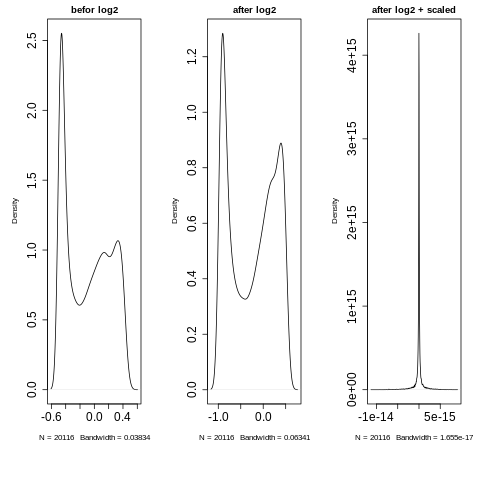

In [ ]:
%%R
options(repr.plot.width=20,repr.plot.height=8)

par(mar = c(8,5,2,2),mfrow=c(1,3),cex.axis=1.5)
plot(density(apply(RNA1, 2, mean, na.rm = TRUE)),main='befor log2')
plot(density(apply(RNA.logged, 2, mean, na.rm = TRUE)),main='after log2')
plot(density(apply(RNA.logged.scaled, 2, mean, na.rm = TRUE)),main='after log2 + scaled')

In [ ]:
%%R
write.csv(RNA.logged.scaled,"/content/gdrive/MyDrive/PHD projects/LUSC Cancer/Meth_preprocessing4.csv")

# Match stage

In [ ]:
import pandas as pd

In [ ]:
# Load the RNA file into a DataFrame

csv_df = pd.read_csv("/content/gdrive/MyDrive/PHD projects/LUSC Cancer/Meth_preprocessing4.csv")

In [ ]:
# Load the clinical file into a DataFrame (assuming it's tab or space-separated)

txt_df = pd.read_csv("/content/gdrive/MyDrive/PHD projects/LUSC Cancer/Clinical.txt", delimiter='\t')  # Adjust the delimiter as needed

In [ ]:
txt_df = txt_df.transpose()

In [ ]:
txt_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
attrib_name,years_to_birth,Tumor_purity,pathologic_stage,pathology_T_stage,pathology_N_stage,pathology_M_stage,histological_type,gender,radiation_therapy,residual_tumor,race,ethnicity,overall_survival,status,overallsurvival
TCGA.18.3406,67,0.5279,stagei,t1,n0,m0,lungsquamouscellcarcinoma-nototherwisespecifie...,male,no,r0,white,nothispanicorlatino,371,1,"371,1"
TCGA.18.3407,72,0.6126,stagei,t2,n0,m0,lungsquamouscellcarcinoma-nototherwisespecifie...,male,no,r0,asian,nothispanicorlatino,136,1,"136,1"
TCGA.18.3409,74,0.6749,stagei,t1,n0,m0,lungbasaloidsquamouscellcarcinoma,male,no,r0,white,nothispanicorlatino,3747,0,"3747,0"
TCGA.18.3410,81,0.7645,stageii,t3,n0,m0,lungsquamouscellcarcinoma-nototherwisespecifie...,male,no,r0,NaN,NaN,146,1,"146,1"


In [ ]:
# Use the first row as the header (column names)
txt_df.columns = txt_df.iloc[0]


In [ ]:
txt_df.head()

attrib_name,years_to_birth,Tumor_purity,pathologic_stage,pathology_T_stage,pathology_N_stage,pathology_M_stage,histological_type,gender,radiation_therapy,residual_tumor,race,ethnicity,overall_survival,status,overallsurvival
attrib_name,years_to_birth,Tumor_purity,pathologic_stage,pathology_T_stage,pathology_N_stage,pathology_M_stage,histological_type,gender,radiation_therapy,residual_tumor,race,ethnicity,overall_survival,status,overallsurvival
TCGA.18.3406,67,0.5279,stagei,t1,n0,m0,lungsquamouscellcarcinoma-nototherwisespecifie...,male,no,r0,white,nothispanicorlatino,371,1,"371,1"
TCGA.18.3407,72,0.6126,stagei,t2,n0,m0,lungsquamouscellcarcinoma-nototherwisespecifie...,male,no,r0,asian,nothispanicorlatino,136,1,"136,1"
TCGA.18.3409,74,0.6749,stagei,t1,n0,m0,lungbasaloidsquamouscellcarcinoma,male,no,r0,white,nothispanicorlatino,3747,0,"3747,0"
TCGA.18.3410,81,0.7645,stageii,t3,n0,m0,lungsquamouscellcarcinoma-nototherwisespecifie...,male,no,r0,NaN,NaN,146,1,"146,1"


In [ ]:
txt_df.reset_index(inplace=True)

In [ ]:
txt_df.head()

attrib_name,index,years_to_birth,Tumor_purity,pathologic_stage,pathology_T_stage,pathology_N_stage,pathology_M_stage,histological_type,gender,radiation_therapy,residual_tumor,race,ethnicity,overall_survival,status,overallsurvival
0,attrib_name,years_to_birth,Tumor_purity,pathologic_stage,pathology_T_stage,pathology_N_stage,pathology_M_stage,histological_type,gender,radiation_therapy,residual_tumor,race,ethnicity,overall_survival,status,overallsurvival
1,TCGA.18.3406,67,0.5279,stagei,t1,n0,m0,lungsquamouscellcarcinoma-nototherwisespecifie...,male,no,r0,white,nothispanicorlatino,371,1,"371,1"
2,TCGA.18.3407,72,0.6126,stagei,t2,n0,m0,lungsquamouscellcarcinoma-nototherwisespecifie...,male,no,r0,asian,nothispanicorlatino,136,1,"136,1"
3,TCGA.18.3409,74,0.6749,stagei,t1,n0,m0,lungbasaloidsquamouscellcarcinoma,male,no,r0,white,nothispanicorlatino,3747,0,"3747,0"
4,TCGA.18.3410,81,0.7645,stageii,t3,n0,m0,lungsquamouscellcarcinoma-nototherwisespecifie...,male,no,r0,NaN,NaN,146,1,"146,1"


In [ ]:
# Rename the first column to 'user ID'
txt_df.rename(columns={txt_df.columns[0]: 'user ID'}, inplace=True)

In [ ]:
txt_df.head()

attrib_name,user ID,years_to_birth,Tumor_purity,pathologic_stage,pathology_T_stage,pathology_N_stage,pathology_M_stage,histological_type,gender,radiation_therapy,residual_tumor,race,ethnicity,overall_survival,status,overallsurvival
0,attrib_name,years_to_birth,Tumor_purity,pathologic_stage,pathology_T_stage,pathology_N_stage,pathology_M_stage,histological_type,gender,radiation_therapy,residual_tumor,race,ethnicity,overall_survival,status,overallsurvival
1,TCGA.18.3406,67,0.5279,stagei,t1,n0,m0,lungsquamouscellcarcinoma-nototherwisespecifie...,male,no,r0,white,nothispanicorlatino,371,1,"371,1"
2,TCGA.18.3407,72,0.6126,stagei,t2,n0,m0,lungsquamouscellcarcinoma-nototherwisespecifie...,male,no,r0,asian,nothispanicorlatino,136,1,"136,1"
3,TCGA.18.3409,74,0.6749,stagei,t1,n0,m0,lungbasaloidsquamouscellcarcinoma,male,no,r0,white,nothispanicorlatino,3747,0,"3747,0"
4,TCGA.18.3410,81,0.7645,stageii,t3,n0,m0,lungsquamouscellcarcinoma-nototherwisespecifie...,male,no,r0,NaN,NaN,146,1,"146,1"


In [ ]:
# Rename the first column in the CSV file to 'user ID'
csv_df.rename(columns={csv_df.columns[0]: 'user ID'}, inplace=True)

In [ ]:
csv_df.head()

,user ID,RBL2,VDAC3,ACTN1,ATP2A1,SFRP1,NIPA2,MAN1B1,TSEN34,LRRC16A,...,BAGE5,BAGE,BAGE2,BAGE4,BAGE3,MIR637,LOC100130932,GOLGA8F,GOLGA8G,MIR7.1
0,TCGA.18.3417,-0.761197,-0.612764,-0.298226,-1.179598,1.008518,-0.985479,-0.550209,-0.635076,-0.752740,...,0.786722,0.786722,0.786722,0.786722,0.786722,0.378833,0.321853,-0.154825,-0.154825,-0.136304
1,TCGA.18.4721,-0.968628,-1.500199,1.011225,2.743803,1.657656,-0.719906,-0.693512,-0.459337,-0.580354,...,0.705285,0.705285,0.705285,0.705285,0.705285,0.087890,0.781825,0.727474,0.727474,-0.054782
2,TCGA.18.5592,1.137829,2.443869,-0.864069,-0.842940,2.455351,0.263336,-0.248512,-0.184553,-0.902539,...,1.021285,1.021285,1.021285,1.021285,1.021285,0.093506,0.144146,-0.525163,-0.525163,-1.069702
3,TCGA.18.5595,-0.324469,0.476860,-0.492540,0.447767,-0.654802,0.564871,0.335795,-0.043648,0.127009,...,-1.356024,-1.356024,-1.356024,-1.356024,-1.356024,-0.398117,-3.295846,-0.803620,-0.803620,-0.642987
4,TCGA.21.5782,0.138349,-0.389305,-0.265474,0.297503,-0.597044,-0.871617,-0.629791,1.804776,-0.397016,...,0.019753,0.019753,0.019753,0.019753,0.019753,0.409479,0.777178,-0.632141,-0.632141,0.233437


In [ ]:
# Merge df1 with the 'stage' column from df2 based on 'user ID'
merged_df2 = pd.merge(csv_df, txt_df[['user ID', 'pathologic_stage']], on='user ID', how='left')

In [ ]:
merged_df2.head()

,user ID,RBL2,VDAC3,ACTN1,ATP2A1,SFRP1,NIPA2,MAN1B1,TSEN34,LRRC16A,...,BAGE,BAGE2,BAGE4,BAGE3,MIR637,LOC100130932,GOLGA8F,GOLGA8G,MIR7.1,pathologic_stage
0,TCGA.18.3417,-0.761197,-0.612764,-0.298226,-1.179598,1.008518,-0.985479,-0.550209,-0.635076,-0.752740,...,0.786722,0.786722,0.786722,0.786722,0.378833,0.321853,-0.154825,-0.154825,-0.136304,stageiv
1,TCGA.18.4721,-0.968628,-1.500199,1.011225,2.743803,1.657656,-0.719906,-0.693512,-0.459337,-0.580354,...,0.705285,0.705285,0.705285,0.705285,0.087890,0.781825,0.727474,0.727474,-0.054782,stagei
2,TCGA.18.5592,1.137829,2.443869,-0.864069,-0.842940,2.455351,0.263336,-0.248512,-0.184553,-0.902539,...,1.021285,1.021285,1.021285,1.021285,0.093506,0.144146,-0.525163,-0.525163,-1.069702,stageii
3,TCGA.18.5595,-0.324469,0.476860,-0.492540,0.447767,-0.654802,0.564871,0.335795,-0.043648,0.127009,...,-1.356024,-1.356024,-1.356024,-1.356024,-0.398117,-3.295846,-0.803620,-0.803620,-0.642987,stagei
4,TCGA.21.5782,0.138349,-0.389305,-0.265474,0.297503,-0.597044,-0.871617,-0.629791,1.804776,-0.397016,...,0.019753,0.019753,0.019753,0.019753,0.409479,0.777178,-0.632141,-0.632141,0.233437,stagei


In [ ]:
merged_df2.to_csv("/content/gdrive/MyDrive/PHD projects/LUSC Cancer/Meth_stage.csv")

In [ ]:
merged_df2.head()

,user ID,RBL2,VDAC3,ACTN1,ATP2A1,SFRP1,NIPA2,MAN1B1,TSEN34,LRRC16A,...,BAGE,BAGE2,BAGE4,BAGE3,MIR637,LOC100130932,GOLGA8F,GOLGA8G,MIR7.1,pathologic_stage
0,TCGA.18.3417,-0.761197,-0.612764,-0.298226,-1.179598,1.008518,-0.985479,-0.550209,-0.635076,-0.752740,...,0.786722,0.786722,0.786722,0.786722,0.378833,0.321853,-0.154825,-0.154825,-0.136304,stageiv
1,TCGA.18.4721,-0.968628,-1.500199,1.011225,2.743803,1.657656,-0.719906,-0.693512,-0.459337,-0.580354,...,0.705285,0.705285,0.705285,0.705285,0.087890,0.781825,0.727474,0.727474,-0.054782,stagei
2,TCGA.18.5592,1.137829,2.443869,-0.864069,-0.842940,2.455351,0.263336,-0.248512,-0.184553,-0.902539,...,1.021285,1.021285,1.021285,1.021285,0.093506,0.144146,-0.525163,-0.525163,-1.069702,stageii
3,TCGA.18.5595,-0.324469,0.476860,-0.492540,0.447767,-0.654802,0.564871,0.335795,-0.043648,0.127009,...,-1.356024,-1.356024,-1.356024,-1.356024,-0.398117,-3.295846,-0.803620,-0.803620,-0.642987,stagei
4,TCGA.21.5782,0.138349,-0.389305,-0.265474,0.297503,-0.597044,-0.871617,-0.629791,1.804776,-0.397016,...,0.019753,0.019753,0.019753,0.019753,0.409479,0.777178,-0.632141,-0.632141,0.233437,stagei


In [ ]:
merged_df2['pathologic_stage'][0]

'stageiv'

In [ ]:
merged_df2['pathologic_stage'][5]

'stagei'

In [ ]:
# Define a mapping function to standardize the stage names
def mapp_stage(stage):
    print("stage", stage)
    if pd.isna(stage):
        return None
    elif stage== 'stagei' :
        return 'Stage One'
    elif  stage== 'stageii' :
        return 'Stage Two'
    elif  stage== 'stageiii' :
        return 'Stage Three'
    elif  stage == 'stageiv' :
        return 'Stage Four'
    else:
        return stage


In [ ]:
merged_df3 = merged_df2

In [ ]:
# Apply the mapping function to the 'stage' column
merged_df3['pathologic_stage'] = merged_df3['pathologic_stage'].apply(mapp_stage)

stage stageiv
stage stagei
stage stageii
stage stagei
stage stagei
stage stagei
stage stagei
stage stagei
stage stageiii
stage stagei
stage stageii
stage stagei
stage stageiii
stage stagei
stage stagei
stage stagei
stage stagei
stage stagei
stage nan
stage stagei
stage stagei
stage stagei
stage stagei
stage stagei
stage stageii
stage stagei
stage stageii
stage stagei
stage stagei
stage stagei
stage stageiii
stage stageii
stage stagei
stage stagei
stage stagei
stage stageiii
stage stagei
stage stageii
stage stageiii
stage stageiii
stage stagei
stage stageii
stage stagei
stage stagei
stage stagei
stage stageii
stage stagei
stage stagei
stage stagei
stage stageii
stage stagei
stage stageii
stage stageiii
stage stageii
stage stagei
stage stagei
stage stageii
stage stagei
stage stageii
stage stageiii
stage stageiv
stage stageii
stage stageii
stage stageiii
stage stageii
stage stageii
stage stageiii
stage stagei
stage stageii
stage stagei
stage stagei
stage stagei
stage stageiii
stage stagei

In [ ]:
merged_df3['pathologic_stage']

,pathologic_stage
0,Stage Four
1,Stage One
2,Stage Two
3,Stage One
4,Stage One
...,...
365,Stage Three
366,Stage Two
367,Stage One
368,Stage Three


In [ ]:
# Drop rows where the 'stage' column is null
merged_df3 = merged_df3.dropna(subset=['pathologic_stage'])

In [ ]:
merged_df3['pathologic_stage']

,pathologic_stage
0,Stage Four
1,Stage One
2,Stage Two
3,Stage One
4,Stage One
...,...
365,Stage Three
366,Stage Two
367,Stage One
368,Stage Three


In [ ]:
# Count the occurrences of each stage
stage_counts = merged_df3['pathologic_stage'].value_counts()

In [ ]:
# Print the counts for each stage
print("Count of each stage:")
print(stage_counts)

Count of each stage:
pathologic_stage
Stage One      172
Stage Two      135
Stage Three     56
Stage Four       4
Name: count, dtype: int64


split  70%  training
30 % testing

Stage One      244  : 170    74
Stage Two      162   : 113  49
Stage Three     84    : 58   26
stageiv          7  :    4  3

In [ ]:
merged_df3.head()

,user ID,RBL2,VDAC3,ACTN1,ATP2A1,SFRP1,NIPA2,MAN1B1,TSEN34,LRRC16A,...,BAGE,BAGE2,BAGE4,BAGE3,MIR637,LOC100130932,GOLGA8F,GOLGA8G,MIR7.1,pathologic_stage
0,TCGA.18.3417,-0.761197,-0.612764,-0.298226,-1.179598,1.008518,-0.985479,-0.550209,-0.635076,-0.752740,...,0.786722,0.786722,0.786722,0.786722,0.378833,0.321853,-0.154825,-0.154825,-0.136304,Stage Four
1,TCGA.18.4721,-0.968628,-1.500199,1.011225,2.743803,1.657656,-0.719906,-0.693512,-0.459337,-0.580354,...,0.705285,0.705285,0.705285,0.705285,0.087890,0.781825,0.727474,0.727474,-0.054782,Stage One
2,TCGA.18.5592,1.137829,2.443869,-0.864069,-0.842940,2.455351,0.263336,-0.248512,-0.184553,-0.902539,...,1.021285,1.021285,1.021285,1.021285,0.093506,0.144146,-0.525163,-0.525163,-1.069702,Stage Two
3,TCGA.18.5595,-0.324469,0.476860,-0.492540,0.447767,-0.654802,0.564871,0.335795,-0.043648,0.127009,...,-1.356024,-1.356024,-1.356024,-1.356024,-0.398117,-3.295846,-0.803620,-0.803620,-0.642987,Stage One
4,TCGA.21.5782,0.138349,-0.389305,-0.265474,0.297503,-0.597044,-0.871617,-0.629791,1.804776,-0.397016,...,0.019753,0.019753,0.019753,0.019753,0.409479,0.777178,-0.632141,-0.632141,0.233437,Stage One


In [ ]:
merged_df3.to_csv("/content/gdrive/MyDrive/PHD projects/LUSC Cancer/Meth_Stage2.csv")

In [ ]:
merged_df3.head()

,user ID,RBL2,VDAC3,ACTN1,ATP2A1,SFRP1,NIPA2,MAN1B1,TSEN34,LRRC16A,...,BAGE,BAGE2,BAGE4,BAGE3,MIR637,LOC100130932,GOLGA8F,GOLGA8G,MIR7.1,pathologic_stage
0,TCGA.18.3417,-0.761197,-0.612764,-0.298226,-1.179598,1.008518,-0.985479,-0.550209,-0.635076,-0.752740,...,0.786722,0.786722,0.786722,0.786722,0.378833,0.321853,-0.154825,-0.154825,-0.136304,Stage Four
1,TCGA.18.4721,-0.968628,-1.500199,1.011225,2.743803,1.657656,-0.719906,-0.693512,-0.459337,-0.580354,...,0.705285,0.705285,0.705285,0.705285,0.087890,0.781825,0.727474,0.727474,-0.054782,Stage One
2,TCGA.18.5592,1.137829,2.443869,-0.864069,-0.842940,2.455351,0.263336,-0.248512,-0.184553,-0.902539,...,1.021285,1.021285,1.021285,1.021285,0.093506,0.144146,-0.525163,-0.525163,-1.069702,Stage Two
3,TCGA.18.5595,-0.324469,0.476860,-0.492540,0.447767,-0.654802,0.564871,0.335795,-0.043648,0.127009,...,-1.356024,-1.356024,-1.356024,-1.356024,-0.398117,-3.295846,-0.803620,-0.803620,-0.642987,Stage One
4,TCGA.21.5782,0.138349,-0.389305,-0.265474,0.297503,-0.597044,-0.871617,-0.629791,1.804776,-0.397016,...,0.019753,0.019753,0.019753,0.019753,0.409479,0.777178,-0.632141,-0.632141,0.233437,Stage One


code for stage 1 and two only

split train and test >> the meth_stage2 file for only stage 1 and 2

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load the data (replace 'your_file.csv' with your actual file path)
# Example assumes a CSV file; adjust as necessary if using Excel or another format
data = pd.read_csv('/content/gdrive/MyDrive/PHD projects/LUSC Cancer/Meth_Stage2.csv')  # If Excel, use pd.read_excel('your_file.xlsx')


In [ ]:
data = merged_df3

In [ ]:
# Filter for Stage One and Stage Two only
filtered_data = data[data['pathologic_stage'].isin(['Stage One', 'Stage Two'])]


In [ ]:
# Split the filtered data into training and testing sets (80% train, 20% test)
train_data, test_data = train_test_split(filtered_data, test_size=0.2, random_state=42)

# Save the split data to new files
train_data.to_csv('/content/gdrive/MyDrive/PHD projects/LUSC Cancer/Meth_train_data_stage_one_two.csv', index=False)
test_data.to_csv('/content/gdrive/MyDrive/PHD projects/LUSC Cancer/Meth_test_data_stage_one_two.csv', index=False)

In [ ]:
import pandas as pd
df1 = train_data
df2 = test_data

In [ ]:
df1.shape

(245, 20118)

In [ ]:
df2.shape

(62, 20118)

In [ ]:
# Filter out rows where the 'stage' column contains "Stage Three" or "Stage Four"
df1_filtered = df1[~df1['pathologic_stage'].isin(['Stage Three', 'Stage Four'])]
df2_filtered = df2[~df2['pathologic_stage'].isin(['Stage Three', 'Stage Four'])]

In [ ]:
df2_filtered.shape

(62, 20118)

In [ ]:
df1_filtered.shape

(245, 20118)

In [ ]:
df2_filtered.head()

,user ID,RBL2,VDAC3,ACTN1,ATP2A1,SFRP1,NIPA2,MAN1B1,TSEN34,LRRC16A,...,BAGE,BAGE2,BAGE4,BAGE3,MIR637,LOC100130932,GOLGA8F,GOLGA8G,MIR7.1,pathologic_stage
218,TCGA.77.8131,-0.089120,-1.193726,-0.943675,0.371542,-0.315764,0.112392,-0.121817,0.654346,-0.523001,...,0.734911,0.734911,0.734911,0.734911,-0.117638,0.302879,0.430859,0.430859,-0.771061,Stage One
77,TCGA.39.5031,0.238971,-0.604149,0.346423,-0.496488,-0.526111,-0.833678,-0.534302,-1.268364,-0.821832,...,-0.154154,-0.154154,-0.154154,-0.154154,0.244822,-0.181535,0.430859,0.430859,-1.116430,Stage One
148,TCGA.56.A62T,1.351360,-0.941351,-1.127082,-0.585381,0.992368,-0.227661,-0.105994,1.027626,0.859824,...,-1.747651,-1.747651,-1.747651,-1.747651,-0.674907,-0.927263,0.915406,0.915406,2.550786,Stage Two
113,TCGA.56.7221,2.979193,3.486889,-0.365787,-1.084962,-0.458756,4.258054,0.978378,5.815063,5.288223,...,-1.709810,-1.709810,-1.709810,-1.709810,-0.818357,-0.887222,-2.180631,-2.180631,1.380868,Stage One
80,TCGA.39.5036,-0.728897,-1.272336,0.922871,-1.070362,-0.850979,-1.023448,-0.661645,0.294380,-0.971803,...,-0.366656,-0.366656,-0.366656,-0.366656,0.174842,0.353441,0.418038,0.418038,-0.788492,Stage One


In [ ]:
df1.head()

,user ID,RBL2,VDAC3,ACTN1,ATP2A1,SFRP1,NIPA2,MAN1B1,TSEN34,LRRC16A,...,BAGE,BAGE2,BAGE4,BAGE3,MIR637,LOC100130932,GOLGA8F,GOLGA8G,MIR7.1,pathologic_stage
288,TCGA.85.A510,-1.519095,2.071852,1.111717,-0.240658,-0.859704,0.301053,0.414433,-0.434288,-0.385575,...,-1.419785,-1.419785,-1.419785,-1.419785,-0.010515,-0.945638,-0.111971,-0.111971,-0.291343,Stage Two
171,TCGA.63.7023,0.570219,0.417943,-0.096478,-0.955966,-1.121716,-0.795747,-0.343663,0.096817,-0.810311,...,0.033591,0.033591,0.033591,0.033591,-0.117638,-0.225207,0.661467,0.661467,-1.087649,Stage Two
301,TCGA.90.A59Q,-1.014169,0.937135,-0.595738,-0.086039,-0.145308,0.564871,-0.121817,-0.635076,0.319527,...,-0.121564,-0.121564,-0.121564,-0.121564,0.289544,0.161661,-0.516293,-0.516293,-0.553938,Stage Two
94,TCGA.43.8115,-0.497220,-0.492303,-0.950789,-0.026344,-0.284075,-0.341145,-0.248512,-0.895758,-1.133726,...,0.089588,0.089588,0.089588,0.089588,0.554023,-0.089615,-0.532770,-0.532770,-0.790236,Stage Two
135,TCGA.56.8624,-1.111958,1.458683,-1.455605,-0.169661,-0.321946,0.790715,0.115202,-0.060203,0.882232,...,1.757698,1.757698,1.757698,1.757698,0.542923,0.302879,0.691104,0.691104,-1.296331,Stage Two


In [ ]:
df2.head()

,user ID,RBL2,VDAC3,ACTN1,ATP2A1,SFRP1,NIPA2,MAN1B1,TSEN34,LRRC16A,...,BAGE,BAGE2,BAGE4,BAGE3,MIR637,LOC100130932,GOLGA8F,GOLGA8G,MIR7.1,pathologic_stage
218,TCGA.77.8131,-0.089120,-1.193726,-0.943675,0.371542,-0.315764,0.112392,-0.121817,0.654346,-0.523001,...,0.734911,0.734911,0.734911,0.734911,-0.117638,0.302879,0.430859,0.430859,-0.771061,Stage One
77,TCGA.39.5031,0.238971,-0.604149,0.346423,-0.496488,-0.526111,-0.833678,-0.534302,-1.268364,-0.821832,...,-0.154154,-0.154154,-0.154154,-0.154154,0.244822,-0.181535,0.430859,0.430859,-1.116430,Stage One
148,TCGA.56.A62T,1.351360,-0.941351,-1.127082,-0.585381,0.992368,-0.227661,-0.105994,1.027626,0.859824,...,-1.747651,-1.747651,-1.747651,-1.747651,-0.674907,-0.927263,0.915406,0.915406,2.550786,Stage Two
113,TCGA.56.7221,2.979193,3.486889,-0.365787,-1.084962,-0.458756,4.258054,0.978378,5.815063,5.288223,...,-1.709810,-1.709810,-1.709810,-1.709810,-0.818357,-0.887222,-2.180631,-2.180631,1.380868,Stage One
80,TCGA.39.5036,-0.728897,-1.272336,0.922871,-1.070362,-0.850979,-1.023448,-0.661645,0.294380,-0.971803,...,-0.366656,-0.366656,-0.366656,-0.366656,0.174842,0.353441,0.418038,0.418038,-0.788492,Stage One


#  XGBOOST

In [ ]:
import pandas as pd
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split


In [ ]:
train_df = df1
test_df = df2

In [ ]:
# Separate features and target variable
X_train = train_df.drop(columns=['pathologic_stage'])
y_train = train_df['pathologic_stage']

In [ ]:
X_test = test_df.drop(columns=['pathologic_stage'])
y_test = test_df['pathologic_stage']

In [ ]:
# Encode the target variable
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

In [ ]:
# Convert the data into DMatrix format (optimized data structure for XGBoost)
dtrain = xgb.DMatrix(X_train.select_dtypes(include=['number', 'bool']), label=y_train_encoded, enable_categorical=True) # Select only numerical and boolean columns or set enable_categorical
dtest = xgb.DMatrix(X_test.select_dtypes(include=['number', 'bool']), label=y_test_encoded, enable_categorical=True) # Select only numerical and boolean columns or set enable_categorical

In [ ]:
# Define XGBoost parameters (these can be tuned)
params = {
    'objective': 'multi:softmax',  # Use 'multi:softprob' for probability outputs
    'num_class': len(label_encoder.classes_),  # Number of classes
    'eval_metric': 'mlogloss',  # Multiclass logloss
    'eta': 0.3,  # Learning rate
    'max_depth': 6,  # Maximum depth of a tree
    'subsample': 0.8,  # Subsample ratio of the training instances
    'colsample_bytree': 0.8  # Subsample ratio of columns when constructing each tree
}

In [ ]:
# Train the model
model = xgb.train(params, dtrain, num_boost_round=100)

In [ ]:
# Make predictions
y_pred = model.predict(dtest)

In [ ]:
# Convert predictions back to original labels
y_pred_labels = label_encoder.inverse_transform(y_pred.astype(int))

In [ ]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_labels)
report = classification_report(y_test, y_pred_labels, target_names=label_encoder.classes_)



In [ ]:
print(f"Accuracy: {accuracy:.2f}")
print("Classification Report:")
print(report)

Accuracy: 0.76
Classification Report:
              precision    recall  f1-score   support

   Stage One       0.84      0.82      0.83        44
   Stage Two       0.58      0.61      0.59        18

    accuracy                           0.76        62
   macro avg       0.71      0.71      0.71        62
weighted avg       0.76      0.76      0.76        62



In [ ]:
import pandas as pd
import xgboost as xgb

# Assuming `model` is your trained model
# Get feature importance (e.g., gain, weight, or cover)
importance = model.get_score(importance_type='weight')  # You can use 'gain' or 'cover' as well

# Convert importance dictionary to DataFrame
importance_df = pd.DataFrame({
    'Feature': list(importance.keys()),
    'Importance': list(importance.values())
})

# Sort by importance (optional)
importance_df = importance_df.sort_values(by='Importance', ascending=False)




In [ ]:
len(importance_df)

628

In [ ]:
# Save the important features to a CSV file
importance_df.to_csv('/content/gdrive/MyDrive/PHD projects/LUSC Cancer/XGboost_Imp628_Meth_stage1_2.csv', index=False)

In [ ]:
#save training and testing for stage 1 and 2 only
df1_filtered.to_csv('/content/gdrive/MyDrive/PHD projects/LUSC Cancer/training_set_Meth_stage1_2.csv', index=False)
df2_filtered.to_csv('/content/gdrive/MyDrive/PHD projects/LUSC Cancer/test_set_Meth_stage1_2.csv', index=False)

# **Integrate Methyaltion features and RNAseq features for deep learning**

In [ ]:
import pandas as pd

# Load the omics data files and important features lists
omics_data1 = pd.read_csv('/content/drive/MyDrive/PHD projects/LUSC Cancer/RNA_Stage3.csv')  # RNA
omics_data2 = pd.read_csv('/content/drive/MyDrive/PHD projects/LUSC Cancer/Meth_Stage2.csv')  # Methyaltion

In [ ]:
# Rename the second column to 'used_ID' in both datasets
omics_data1.columns.values[1] = 'used_ID'
omics_data2.columns.values[1] = 'used_ID'

In [ ]:
omics_data2.head()

,Unnamed: 0,used_ID,RBL2,VDAC3,ACTN1,ATP2A1,SFRP1,NIPA2,MAN1B1,TSEN34,...,BAGE,BAGE2,BAGE4,BAGE3,MIR637,LOC100130932,GOLGA8F,GOLGA8G,MIR7.1,pathologic_stage
0,0,TCGA.18.3417,-0.761197,-0.612764,-0.298226,-1.179598,1.008518,-0.985479,-0.550209,-0.635076,...,0.786722,0.786722,0.786722,0.786722,0.378833,0.321853,-0.154825,-0.154825,-0.136304,Stage Four
1,1,TCGA.18.4721,-0.968628,-1.500199,1.011225,2.743803,1.657656,-0.719906,-0.693512,-0.459337,...,0.705285,0.705285,0.705285,0.705285,0.087890,0.781825,0.727474,0.727474,-0.054782,Stage One
2,2,TCGA.18.5592,1.137829,2.443869,-0.864069,-0.842940,2.455351,0.263336,-0.248512,-0.184553,...,1.021285,1.021285,1.021285,1.021285,0.093506,0.144146,-0.525163,-0.525163,-1.069702,Stage Two
3,3,TCGA.18.5595,-0.324469,0.476860,-0.492540,0.447767,-0.654802,0.564871,0.335795,-0.043648,...,-1.356024,-1.356024,-1.356024,-1.356024,-0.398117,-3.295846,-0.803620,-0.803620,-0.642987,Stage One
4,4,TCGA.21.5782,0.138349,-0.389305,-0.265474,0.297503,-0.597044,-0.871617,-0.629791,1.804776,...,0.019753,0.019753,0.019753,0.019753,0.409479,0.777178,-0.632141,-0.632141,0.233437,Stage One


In [ ]:
omics_data1.head()

,Unnamed: 0,used_ID,A1BG,A1CF,A2BP1,A2LD1,A2ML1,A2M,A4GALT,A4GNT,...,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3,psiTPTE22,tAKR,pathologic_stage
0,0,TCGA.18.3406,2.082567,-0.344298,-0.761194,1.491501,-0.084838,0.320329,-1.780532,-1.307881,...,0.596761,-3.169258,-1.565509,1.443790,-1.533163,-2.795009,-0.015112,-0.673646,-0.638752,Stage One
1,1,TCGA.18.3407,-0.560696,1.344181,-0.761194,0.825985,0.579753,0.556363,0.382378,0.162847,...,-0.157010,-0.093949,-0.836719,0.967744,0.133135,-0.508941,0.803471,-0.322237,0.357160,Stage One
2,2,TCGA.18.3408,-6.885965,-0.344298,1.318789,1.243880,0.002177,0.829102,-1.722884,1.075867,...,0.418552,-0.886765,-0.557189,-0.000256,-4.632011,-0.897257,0.064932,-0.813220,3.079064,Stage One
3,3,TCGA.18.3409,0.781261,-0.344298,3.107380,-0.251774,-2.366846,1.370447,-1.314515,0.221579,...,1.663155,-0.499664,-1.941348,1.991585,0.210911,-0.208258,0.951003,0.552382,-0.638752,Stage One
4,4,TCGA.18.3410,1.262285,-0.344298,-0.761194,1.512183,0.501695,-0.523424,0.152565,-0.455367,...,-0.810209,-0.636320,1.051080,0.349912,-0.547665,-0.408381,0.547827,-0.871896,2.542111,Stage Two


In [ ]:
#check for stage one and two nly
# Step 2: Filter for "Stage One" and "Stage Two" only in each dataset
omics_data1_filtered = omics_data1[omics_data1['pathologic_stage'].isin(['Stage One', 'Stage Two'])]
omics_data2_filtered = omics_data2[omics_data2['pathologic_stage'].isin(['Stage One', 'Stage Two'])]

In [ ]:
omics_data2.shape

(367, 20119)

In [ ]:
omics_data2_filtered.shape

(307, 20119)

In [ ]:
omics_data1.shape

(497, 20106)

In [ ]:
omics_data1_filtered.shape

(406, 20106)

In [ ]:
# Step 3: Load important features for each omics data file
important_features1 = pd.read_csv('/content/drive/MyDrive/PHD projects/LUSC Cancer/XGboost_Imp293_RNA_stage1_2.csv')['Feature'].tolist()  # Column 'Feature' with feature names
important_features2 = pd.read_csv('/content/drive/MyDrive/PHD projects/LUSC Cancer/XGboost_Imp628_Meth_stage1_2.csv')['Feature'].tolist()  # Column 'Feature' with feature names


In [ ]:
# Step 4: Add 'user_id' and 'pathologic_stage' columns to the list of important features to retain them
important_features1 = ['used_ID', 'pathologic_stage'] + important_features1
important_features2 = ['used_ID', 'pathologic_stage'] + important_features2

In [ ]:
# Step 5: Filter each data file to include only the important features along with 'user_id' and 'pathologic_stage'
filtered_omics_data1 = omics_data1_filtered[important_features1]
filtered_omics_data2 = omics_data2_filtered[important_features2]

In [ ]:
filtered_omics_data1.shape

(406, 295)

In [ ]:
filtered_omics_data2.shape

(307, 630)

In [ ]:
filtered_omics_data1.head()

,used_ID,pathologic_stage,EEPD1,TBCD,BCL2L15,CSDE1,CRYM,CNOT6,TCOF1,SGK196,...,C21orf63,CTAG2,BCKDHA,EIF3D,MED29,SLC9A7,RTTN,ZNF211,FBXO3,ANTXR2
0,TCGA.18.3406,Stage One,-1.425552,-1.468343,0.334986,-0.188281,0.289277,0.561623,-3.568099,-1.059089,...,0.475565,1.162738,0.082836,0.415555,0.286477,0.186085,-1.195562,0.707657,2.679667,0.522746
1,TCGA.18.3407,Stage One,-0.956841,-0.864823,0.848965,0.837469,0.459199,0.970911,-1.198249,0.283290,...,1.248756,0.195141,0.472790,-1.316279,-0.869398,-1.334698,0.074061,0.484698,1.431830,0.638426
2,TCGA.18.3408,Stage One,0.900606,-3.237435,0.476129,-0.246343,0.054572,-1.002107,-4.824658,0.185482,...,1.242521,0.507161,-2.802087,0.954451,-1.195184,0.292634,0.106952,-0.698272,2.284975,-0.167033
3,TCGA.18.3409,Stage One,-0.081091,-0.706481,0.420585,1.658182,0.085301,0.841968,-1.810972,0.404480,...,-0.798108,0.390260,-0.081606,0.289970,0.046686,-0.499528,-0.544979,0.147466,1.153715,1.319158
4,TCGA.18.3410,Stage Two,-2.564502,2.438307,-0.568568,0.419684,-1.415664,0.046315,-1.383385,0.604074,...,-0.067161,-0.833932,2.044029,-0.284544,-0.523241,1.856679,0.802509,0.738265,1.854354,0.141068


In [ ]:
filtered_omics_data2.head()

,used_ID,pathologic_stage,CACNA1A,ZNF235,C22orf41,NOL11,C8orf71,FAM66C,FLJ42709,ELFN2,...,EFCAB7,APPL2,TMEM144,PVRL3,STK11IP,CYP26C1,ABCB6,WBSCR16,LRRFIP2,TAS2R19
1,TCGA.18.4721,Stage One,0.360573,0.166886,1.810852,-0.022423,0.332307,-0.051316,-0.103946,-0.412891,...,-0.300103,-0.420329,0.400339,-0.362315,-0.036476,-0.069607,0.464441,-1.581957,1.603970,0.357473
2,TCGA.18.5592,Stage Two,-1.235093,-0.354320,-0.143981,0.060129,0.696131,-1.268075,2.040916,-0.507562,...,-0.764823,0.115193,-0.700340,0.282742,0.021042,1.286836,0.202008,-0.762674,-0.301961,0.508889
3,TCGA.18.5595,Stage One,1.489765,-0.932047,0.267080,-0.668132,0.411637,-2.144968,3.369843,0.263441,...,-0.680172,-1.923189,1.812421,3.544332,0.043605,-2.003523,-0.251833,0.049090,-1.968132,0.311052
4,TCGA.21.5782,Stage One,-0.714460,-0.244797,0.260062,-1.023378,0.645971,-0.123233,-0.326026,-0.409806,...,-0.605704,-1.519863,0.887508,-0.075185,-0.450863,0.418723,0.522685,-0.728701,0.451702,0.157399
5,TCGA.21.5783,Stage One,1.274445,0.024680,0.469563,0.286210,-1.167626,-0.678527,0.527566,-0.281259,...,-0.482054,0.898244,0.110710,-0.720997,-0.450863,-0.309197,0.530134,-0.372774,1.386484,0.187120


In [ ]:
# Step 6: Merge the two filtered data files on 'used_ID'
merged_data = pd.merge(filtered_omics_data1, filtered_omics_data2, on='used_ID', how='inner')


In [ ]:
merged_data.shape

(307, 924)

In [ ]:
# Step 7: Save the final merged file
merged_data.to_csv('/content/drive/MyDrive/PHD projects/LUSC Cancer/merged_final_RNA_Meth_data.csv', index=False)

print("Merged data saved to 'merged_filtered_omics_data.csv'")

Merged data saved to 'merged_filtered_omics_data.csv'


#Deep Learning

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load the merged omics data file
merged_data = pd.read_csv('/content/drive/MyDrive/PHD projects/LUSC Cancer/merged_final_RNA_Meth_data.csv')  # Replace with your act

In [ ]:
# Drop the 'used_ID' column as it’s not relevant for model training
merged_data = merged_data.drop(columns=['used_ID' ,'pathologic_stage_y'])




In [ ]:
merged_data.head()

,pathologic_stage_x,EEPD1,TBCD,BCL2L15,CSDE1,CRYM,CNOT6,TCOF1,SGK196,OR1F1,...,EFCAB7,APPL2,TMEM144,PVRL3,STK11IP,CYP26C1,ABCB6,WBSCR16,LRRFIP2,TAS2R19
0,Stage One,-0.136474,-1.107097,-1.018569,-0.424914,-0.445073,-0.432654,-1.518505,0.603806,-0.869025,...,-0.300103,-0.420329,0.400339,-0.362315,-0.036476,-0.069607,0.464441,-1.581957,1.603970,0.357473
1,Stage Two,1.475594,0.970662,-2.765482,-0.873573,-0.861587,-0.760480,0.136749,0.845325,-0.133434,...,-0.764823,0.115193,-0.700340,0.282742,0.021042,1.286836,0.202008,-0.762674,-0.301961,0.508889
2,Stage One,-0.497534,0.502236,-0.341154,0.986860,-0.556997,1.451706,1.100765,1.389643,-0.869025,...,-0.680172,-1.923189,1.812421,3.544332,0.043605,-2.003523,-0.251833,0.049090,-1.968132,0.311052
3,Stage One,1.297807,1.192220,1.034722,0.683759,0.657247,-0.269736,-0.209325,-0.190068,1.739054,...,-0.605704,-1.519863,0.887508,-0.075185,-0.450863,0.418723,0.522685,-0.728701,0.451702,0.157399
4,Stage One,-0.552522,0.444108,0.208580,0.676968,-0.772129,1.852739,2.117342,0.513188,1.926357,...,-0.482054,0.898244,0.110710,-0.720997,-0.450863,-0.309197,0.530134,-0.372774,1.386484,0.187120


In [ ]:
# Define the target column and feature columns
# Assuming the 'pathologic_stage' column is the target for classification
target_column = 'pathologic_stage_x'
features = merged_data.drop(columns=[target_column])  # All columns except the target

In [ ]:
# Split data into features (X) and target (y)
X = features
y = merged_data[target_column]

In [ ]:
# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Optional: Save the split data to CSV files
X_train.to_csv('/content/drive/MyDrive/PHD projects/LUSC Cancer/DL_X_train.csv', index=False)
X_test.to_csv('/content/drive/MyDrive/PHD projects/LUSC Cancer/DL_X_test.csv', index=False)
y_train.to_csv('/content/drive/MyDrive/PHD projects/LUSC Cancer/DL_y_train.csv', index=False)
y_test.to_csv('/content/drive/MyDrive/PHD projects/LUSC Cancer/DL_y_test.csv', index=False)

print("Data split into train and test sets and saved to CSV files.")

Data split into train and test sets and saved to CSV files.


In [ ]:
X_train.shape

(245, 921)

In [ ]:
X_test.shape

(62, 921)

In [ ]:
training_array = X_train.values
test_array = X_test.values

In [ ]:
y_train = y_train.values
y_test = y_test.values

In [ ]:
print(training_array.shape)

(245, 921)


In [ ]:
print(test_array.shape)

(62, 921)


In [ ]:
# Reshape and normalize training data
trainX = training_array[:, 0:920].reshape(training_array.shape[0],1,23, 40).astype( 'float32' )


In [ ]:
# Reshape and normalize test data
testX = test_array[:, 0:920].reshape(test_array.shape[0],1,23,40).astype( 'float32' )

In [ ]:
#normalization
X_train = trainX

In [ ]:
#normalization
X_test = testX

In [ ]:
y_train

array(['Stage One', 'Stage Two', 'Stage One', 'Stage Two', 'Stage One',
       'Stage One', 'Stage One', 'Stage Two', 'Stage Two', 'Stage One',
       'Stage Two', 'Stage Two', 'Stage Two', 'Stage One', 'Stage One',
       'Stage Two', 'Stage One', 'Stage Two', 'Stage One', 'Stage Two',
       'Stage One', 'Stage One', 'Stage One', 'Stage Two', 'Stage One',
       'Stage One', 'Stage One', 'Stage One', 'Stage One', 'Stage One',
       'Stage Two', 'Stage One', 'Stage Two', 'Stage One', 'Stage Two',
       'Stage One', 'Stage One', 'Stage Two', 'Stage One', 'Stage One',
       'Stage Two', 'Stage Two', 'Stage Two', 'Stage Two', 'Stage Two',
       'Stage One', 'Stage Two', 'Stage One', 'Stage One', 'Stage Two',
       'Stage One', 'Stage Two', 'Stage One', 'Stage One', 'Stage One',
       'Stage Two', 'Stage Two', 'Stage Two', 'Stage One', 'Stage One',
       'Stage One', 'Stage Two', 'Stage Two', 'Stage One', 'Stage One',
       'Stage Two', 'Stage Two', 'Stage Two', 'Stage Two', 'Stag

In [ ]:
y_test

array(['Stage One', 'Stage One', 'Stage One', 'Stage One', 'Stage One',
       'Stage Two', 'Stage One', 'Stage Two', 'Stage Two', 'Stage Two',
       'Stage Two', 'Stage Two', 'Stage One', 'Stage One', 'Stage Two',
       'Stage Two', 'Stage One', 'Stage Two', 'Stage One', 'Stage One',
       'Stage One', 'Stage One', 'Stage One', 'Stage One', 'Stage One',
       'Stage One', 'Stage One', 'Stage Two', 'Stage One', 'Stage One',
       'Stage One', 'Stage One', 'Stage Two', 'Stage Two', 'Stage Two',
       'Stage One', 'Stage Two', 'Stage One', 'Stage Two', 'Stage One',
       'Stage One', 'Stage One', 'Stage Two', 'Stage Two', 'Stage One',
       'Stage Two', 'Stage One', 'Stage One', 'Stage Two', 'Stage Two',
       'Stage One', 'Stage Two', 'Stage One', 'Stage Two', 'Stage Two',
       'Stage One', 'Stage Two', 'Stage Two', 'Stage Two', 'Stage Two',
       'Stage One', 'Stage One'], dtype=object)

In [ ]:
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
y_train = lb.fit_transform(y_train)
y_test = lb.fit_transform(y_test)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
import tensorflow.keras.backend as K

In [ ]:
model = Sequential()
K.set_image_data_format('channels_first')
model.add(Convolution2D(128,5, 5,  input_shape=(1,23, 40),activation= 'relu' , padding='same' ))
model.add(MaxPooling2D(pool_size=(2, 2)))
#model.add(Dropout(0.5))


#model.add(Convolution2D(64, 3, 3, activation= 'relu' , padding='same' ))
#model.add(MaxPooling2D(pool_size=(2, 2)))
#model.add(Dropout(0.5))

model.add(Convolution2D(32, 3, 3, activation= 'relu' , padding='same' ))
#model.add(MaxPooling2D(pool_size=(2, 2)))
#model.add(Dropout(0.5))

#model.add(Convolution2D(8, 3, 3, activation= 'relu' , padding='same' ))
#model.add(MaxPooling2D(pool_size=(2, 2)))
#model.add(Dropout(0.5))

model.add(Flatten())
model.add(Dense(1024, activation= 'relu' ))
model.add(Dense(500, activation= 'relu' ))
model.add(Dense(1, activation= 'sigmoid' ))
#model.add(Dropout(0.5))


In [ ]:
model.compile(loss= 'binary_crossentropy' , optimizer= 'adam' , metrics=[ 'accuracy' ])

In [ ]:
model.fit(X_train, y_train,
          epochs=100,
         )

Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 226ms/step - accuracy: 0.5010 - loss: 0.6945
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6317 - loss: 0.6306 
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7444 - loss: 0.5642 
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8744 - loss: 0.3906 
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9164 - loss: 0.2492 
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9815 - loss: 0.0968 
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9936 - loss: 0.0352 
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 0.0097 
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0027 
Epoch 10/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 0.0012     
Epoch 11/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 4.8946e-04 
Epoch 12/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0

In [ ]:
score = model.evaluate(X_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 447ms/step - accuracy: 0.8192 - loss: 1.1113


In [ ]:
model_json = model.to_json()
with open("/content/drive/MyDrive/PHD projects/LUSC Cancer/LUSC_Model_RNA_Meth.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("/content/drive/MyDrive/PHD projects/LUSC Cancer/LUSC_Model_RNA_Meth.weights.h5") # Added the .weights extension to the filename
print("Saved model to disk")

Saved model to disk


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
# Predict the labels for the test data
y_pred = model.predict(X_test)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 273ms/step


In [ ]:
# Predict the labels for the test data
y_pred = model.predict(X_test)
# Convert predicted probabilities to class labels (0 or 1)
y_pred_classes = (y_pred > 0.5).astype(int) # Assuming 0.5 as the threshold

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred_classes)) # Use y_pred_classes instead of y_pred

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.89      0.85        35
           1       0.83      0.74      0.78        27

    accuracy                           0.82        62
   macro avg       0.82      0.81      0.82        62
weighted avg       0.82      0.82      0.82        62



In [ ]:
# Classification Report
print("Classification Report:")
report = classification_report(y_test, y_pred_classes) # Store the classification report in the variable 'report'
print(report) # Use y_pred_classes instead of y_pred

# Save the report to a file
with open('/content/drive/MyDrive/PHD projects/LUSC Cancer/LUSC_DL_RNA_Meth_classification_report.txt', 'w') as f:
    f.write(report)
print("Classification report saved to classification_report.txt")

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.89      0.85        35
           1       0.83      0.74      0.78        27

    accuracy                           0.82        62
   macro avg       0.82      0.81      0.82        62
weighted avg       0.82      0.82      0.82        62

Classification report saved to classification_report.txt


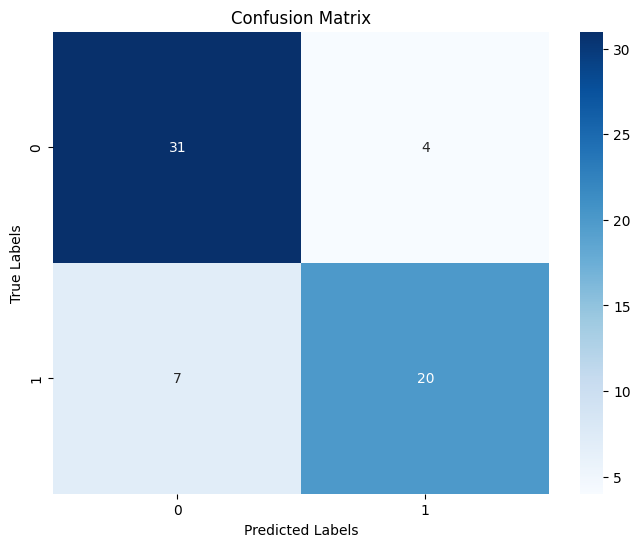

In [ ]:
# Confusion Matrix
# Convert predicted probabilities to class labels (0 or 1)
y_pred_classes = (y_pred > 0.5).astype(int)  # Assuming 0.5 as the threshold

conf_matrix = confusion_matrix(y_test, y_pred_classes) #Use y_pred_classes for discrete labels

# Display the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
# Instead of model.classes_, use a list of your class labels
class_labels = [0, 1]  # Replace with your actual class labels if different
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
# Save the confusion matrix plot to a file
plt.savefig('/content/drive/MyDrive/PHD projects/LUSC Cancer/LUSC_DL_RNA_Meth_confusion_matrix.png')

plt.show()

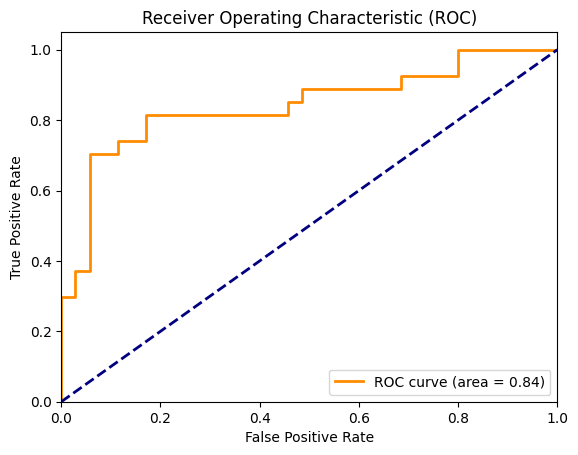

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt

# ... (rest of your code) ...

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)  # Use y_pred (probabilities) for ROC curve
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
# Save the ROC curve plot
plt.savefig('/content/drive/MyDrive/PHD projects/LUSC Cancer/LUSC_DL_RNA_Meth_roc_curve.png')

plt.show()

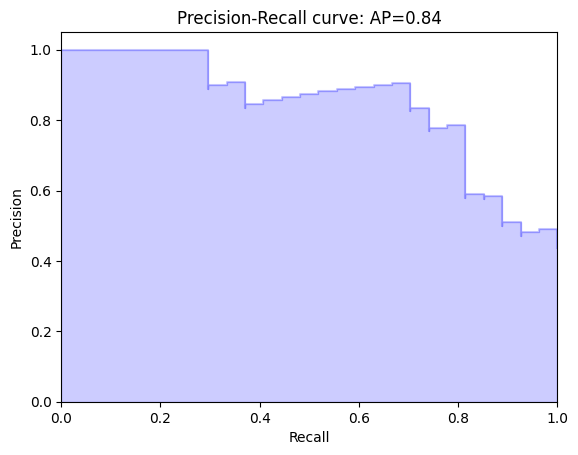

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, average_precision_score
import seaborn as sns
import matplotlib.pyplot as plt

# ... (rest of your code) ...

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_pred)
average_precision = average_precision_score(y_test, y_pred)

plt.figure()
plt.step(recall, precision, color='b', alpha=0.2, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve: AP={0:0.2f}'.format(average_precision))

# Save the Precision-Recall curve plot
plt.savefig('/content/drive/MyDrive/PHD projects/LUSC Cancer/LUSC_DL_RNA_Meth_precision_recall_curve.png')

plt.show()

need to know the integrated file (RNA and MEthyaltuin ... how many stage 1 and how mant stage 2

In [ ]:
import pandas as pd

# Read the merged data file
merged_data = pd.read_csv('/content/drive/MyDrive/PHD projects/LUSC Cancer/merged_final_RNA_Meth_data.csv')

# Assuming there is a column named 'stage' in the data
# Replace 'stage' with the actual column name containing stage information
stage_counts = merged_data['pathologic_stage_y'].value_counts()

print("Number of stage 1 and stage 2 entries:")
print(stage_counts[['Stage One', 'Stage Two']])

Number of stage 1 and stage 2 entries:
pathologic_stage_y
Stage One    172
Stage Two    135
Name: count, dtype: int64
